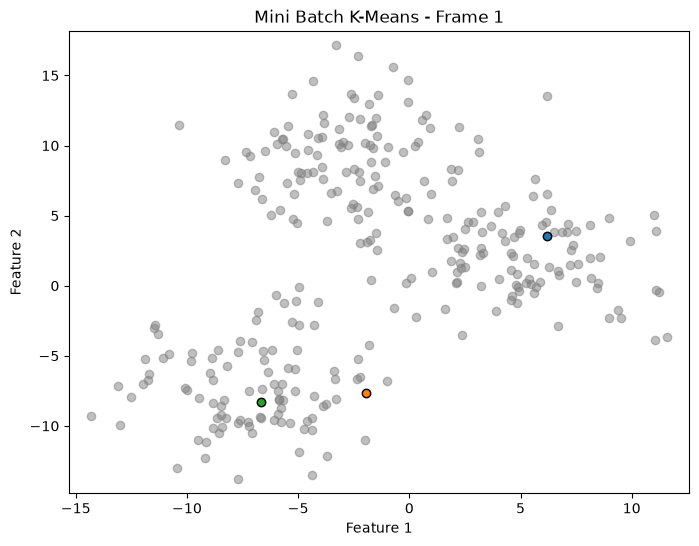

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from sklearn.datasets import make_blobs
from IPython.display import HTML

# Function to calculate the Euclidean distance
def euclidean_distance(a, b):
    return np.sqrt(np.sum((a - b) ** 2, axis=1))

# Mini Batch K-Means algorithm
def mini_batch_kmeans(X, k, b, t):
    # Randomly initialize centroids
    centroids = X[np.random.choice(X.shape[0], k, replace=False)]
    # Track centroids over time for visualization
    centroids_history = [centroids.copy()]
    # Update counts for each centroid
    v = np.zeros(k)

    # Run the algorithm for t iterations
    for i in range(t):
        # Randomly select a mini-batch
        M = X[np.random.choice(X.shape[0], b, replace=False)]
        # Update centroids with mini-batch
        for x in M:
            # Find the nearest centroid
            distances = euclidean_distance(x, centroids)
            nearest_centroid_index = np.argmin(distances)
            v[nearest_centroid_index] += 1
            eta = 1 / v[nearest_centroid_index]
            centroids[nearest_centroid_index] = (1 - eta) * centroids[nearest_centroid_index] + eta * x
            centroids_history.append(centroids.copy())

    return centroids, centroids_history

# Generate synthetic data
X, _ = make_blobs(n_samples=300, centers=3, n_features=2, random_state=42, cluster_std=3.0)

# Parameters for Mini Batch K-Means
k = 3  # Number of clusters
b = 10  # Batch size
t = 20  # Number of iterations

# Run Mini Batch K-Means
final_centroids, centroids_history = mini_batch_kmeans(X, k, b, t)

# Animation function
def animate(i):
    plt.cla()
    plt.scatter(X[:, 0], X[:, 1], c='gray', alpha=0.5)
    for j, c in enumerate(centroids_history[i]):
        plt.scatter(*c, color=f'C{j}', edgecolor='black')

    plt.title(f'Mini Batch K-Means - Frame {i+1}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.xlim(np.min(X[:,0]) - 1, np.max(X[:,0]) + 1)
    plt.ylim(np.min(X[:,1]) - 1, np.max(X[:,1]) + 1)

# Create animation
fig = plt.figure(figsize=(8, 6))
ani = animation.FuncAnimation(fig, animate, frames=len(centroids_history), interval=100, repeat=False)

# Display the animation without requiring FFmpeg
HTML(ani.to_jshtml())